In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib
import matplotlib.pyplot as plt
import anndata as ad
import scipy
import seaborn as sns
import scanpy as sc
import muon as mu
import math
from matplotlib.pyplot import rc_context
import os
from anndata import AnnData
import scvi
import pertpy as pt

In [4]:
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [7]:
sc._settings.settings._vector_friendly=True
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=300,dpi_save = 300,
    facecolor="white",
    frameon=False, fontsize = 8
)
sc.settings.figdir = "/new_figs/Fig_1/"
sns.set_theme(style="white")

In [9]:
color_dict_samples = {
    'AML3': 'darkred',
    'AML4': 'red',
    'AML5': 'tomato',
    'AML6': 'sienna',
    'AML7': 'darkorange',
    'AML8': '#8C564B',
    'AML9_Dx': 'gold',
    'AML9_Rel': 'seagreen',
    'AML10_Dx': 'khaki',
    'AML10_Rel': 'forestgreen',
    'AML11_Dx': 'darkviolet',
    'AML11_Rel': 'teal',
    'AML12_Dx': '#2CA02C',
    'AML12_Post': '#D62728',
    'AML12_Rel': '#9467BD',
    'AML13_Dx': '#8C564B',
    'AML13_Post': '#E377C2',
    'AML13_Rel': '#7F7F7F',
    'AML14_Dx': '#BCBD22',
    'AML14_Rel': '#17BECF',
    'AML15_Dx': '#FF33CC',
    'AML15_Rel': '#33CCFF',
    'CB1': 'grey',
    'CB2': 'grey',
    'HD1': 'grey',
    'HD2': 'grey',
    'PBM': 'grey'
    }

color_dict_cyto = {'NUP98r': 'brown',
    'GLIS2': 'red',
    'DEK_NUP214': 'blue',
    'MNX1': 'olive',
    'KMT2Ar': 'green',
    'RUNX1_RUNX1T1': 'violet',
    'CBFB_MYH11': 'indigo',
    'Healthy': 'lightgrey',
    'unknown': 'tan'
    }

custom_fusion_colors = {
        'Unknown': 'lightgrey',        # Grey
        'NUP98-NSD1': '#D55E00',     # Vermillion (red-orange)
        'CBFA2-GLIS2': '#0173B2',    # Blue
        'DEK-NUP214': 'red',         # Red
        'MLLT10-KMT2A': '#F0E442',   # Yellow
        'MNX1-ETV6': '#CC79A7',      # Reddish purple
        'KMT2A-AFDN': '#E69F00',     # Orange
        'RUNX1-RUNX1T1': '#56B4E9',  # Sky blue
        'CBFB-MYH11': 'brown',       # Brown
        'MLLT3-KMT2A': '#8B4513',     # Brown
        'Healthy': 'green',
    }

color_dict_state = {'Dx': 'teal',
    'Rel': 'maroon',
    'Healthy': 'tan',
    'Post': 'navy'
    }


TYPE_COLORS = {
    'Healthy': '#ADD8E6',  # lightblue
    'AML': '#A65628'     # brown
}

color_dict_sample_broad = {
    'AML3': 'green',
    'AML4': 'red',
    'AML5': 'crimson',
    'AML6': 'orange',
    'AML7': 'navy',
    'AML8': 'blue',
    'AML9': 'skyblue',
    'AML10': 'brown',
    'AML11': 'khaki',
    'AML12': 'coral',
    'AML13': 'magenta',
    'AML14': 'darkmagenta',
    'AML15': 'olive',
    'AML16': 'purple',
    'AML17': 'teal',
    'AML19': 'goldenrod', 
    'Healthy': 'lightgrey',
}

color_dict_LSC2 = {'High_LSC_score': 'brown',
    'Medium_LSC_score': 'rosybrown',
    'Low_LSC_score': 'green',
    'HSCs': 'blue',
    }

Malignant_normal = {'Malignant_LSC': 'brown',
    'Malignant_Blast': 'rosybrown',
    'Healthy_micro_env': 'green'
    } 

In [15]:
files = [file for file in os.listdir("/samples/")]
files

['AML7.h5mu',
 'AML12_Rel.h5mu',
 'AML13_Post.h5mu',
 'AML6.h5mu',
 'AML10_Dx.h5mu',
 'AML19_Rel.h5mu',
 'AML12_Post.h5mu',
 'mdata_healthy.h5mu',
 'AML16_Rel.h5mu',
 'AML9_Rel.h5mu',
 'AML14_Dx.h5mu',
 'AML9_Dx.h5mu',
 'AML11_Dx.h5mu',
 'AML4.h5mu',
 'AML3.h5mu',
 'AML12_Dx.h5mu',
 'AML13_Rel.h5mu',
 'AML17_Rel.h5mu',
 'AML5.h5mu',
 'AML11_Rel.h5mu',
 'AML8.h5mu',
 'AML15_Dx.h5mu',
 'AML14_Rel.h5mu',
 'AML19_Dx.h5mu',
 'AML13_Dx.h5mu',
 'AML10_Rel.h5mu',
 'AML15_Rel.h5mu']

In [ ]:
rna_list = []
adt_list = []
for file in files:
    print(f"working on:{file}")
    mdata = mu.read(c_dir + "/" +  file)
    rna_list.append(mdata["rna"])
    adt_list.append(mdata["adt"])

RNA = sc.concat(rna_list)
ADT = sc.concat(adt_list)

mdata = mu.MuData({"rna": RNA, "adt": ADT})
mdata

In [11]:
def fus(sample):
    if sample  == "AML3":
        return "NUP98-NSD1"
    if sample  == "AML4":
        return "CBFA2-GLIS2"
    if sample  == "AML5":
        return "DEK-NUP214"
    if sample  == "AML6":
        return "MLLT3-KMT2A"
    if sample  == "AML7":
        return "MNX1-ETV6"
    if sample  == "AML8":
        return "KMT2A-AFDN"
    if sample  == "AML10_Dx":
        return "KMT2A-AFDN"
    if sample  == "AML10_Rel":
        return "KMT2A-AFDN"        
    if sample  == "AML11_Dx":
        return "MLLT10-KMT2A"    
    if sample  == "AML11_Rel":
        return "MLLT10-KMT2A"      
    if sample  == "AML13_Dx":
        return "RUNX1-RUNX1T1" 
    if sample  == "AML13_Rel":
        return "RUNX1-RUNX1T1"      
    if sample  == "AML14_Dx":
        return "CBFB-MYH11"  
    if sample  == "AML14_Rel":
        return "CBFB-MYH11"     
    if sample  == "AML15_Dx":
        return "CBFB-MYH11"   
    if sample  == "AML15_Rel":
        return "CBFB-MYH11"    
    if sample  == "AML16_Rel":
        return "MLLT3-KMT2A" 
    if sample  == "AML17_Rel":
        return "MLLT3-KMT2A" 
    if sample in ["PBM","CB1","CB2","HD1","HD2"]:    
        return "Healthy"       
    else:
        return "Unknown"                      
mdata["rna"].obs["Cytogenetics"] = mdata["rna"].obs["sample"].map(fus)  

def label_samples(x):
    if x.startswith('CB') or x.startswith('PBM') or x.startswith('HD'):
        return 'Healthy'
    elif 'Post' in x:
        return 'Post'
    elif 'Rel' in x:
        return 'Rel'
    else:
        return 'Dx'
mdata["rna"].obs["state"] = mdata["rna"].obs["sample"].map(label_samples)

def label_samples2(x):
    if x.startswith('CB') or x.startswith('PBM') or x.startswith('HD'):
        return 'Healthy'
    else:
        return "AML"
mdata["rna"].obs["state_major"] = mdata["rna"].obs["sample"].map(label_samples2)        

def label_samples_Major(x):
    if x == "AML9_Dx":
        return 'AML9'
    if x == "AML9_Rel":
        return 'AML9'

    if x == "AML10_Dx":
        return 'AML10'
    if x == "AML10_Rel":
        return 'AML10'

    if x == "AML11_Dx":
        return 'AML11'
    if x == "AML11_Rel":
        return 'AML11'

    if x == "AML12_Dx":
        return 'AML12'    
    if x == "AML12_Post":
        return 'AML12'
    if x == "AML12_Rel":
        return 'AML12'  

    if x == "AML13_Dx":
        return 'AML13'    
    if x == "AML13_Post":
        return 'AML13'
    if x == "AML13_Rel":
        return 'AML13'  

    if x == "AML14_Dx":
        return 'AML14'
    if x == "AML14_Rel":
        return 'AML14'     

    if x == "AML15_Dx":
        return 'AML15'    
    if x == "AML15_Rel":
        return 'AML15'
    
    if x == "AML16_Rel":
        return 'AML16'    
    if x == "AML17_Rel":
        return 'AML17'
    if x == "AML19_Dx":
        return 'AML19'    
    if x == "AML19_Rel":
        return 'AML19'

    if x in ["CB1","CB2","HD1","HD2","PBM"]:
        return 'Healthy'  
    else:
        return x
mdata["rna"].obs["sample_major"] =  mdata["rna"].obs["sample"].map(label_samples_Major)

def immu_group (sample):
    if sample in ["AML4","AML7","AML12_Dx","AML12_Rel"]:    
        return "Erythroid_MK_like"
    if sample in ["AML11_Dx", "AML11_Rel","AML6","AML8"]:
        return "GMP_like"
    if sample in ["CB1","CB2","HD1","HD2","PBM"] :
        return "Healthy"  
    else:
        return "Primitive_like"        

mdata["rna"].obs["immu_phe"] =  mdata["rna"].obs["sample"].map(immu_group) 

In [23]:
def sc_wf(adata, cluster_on_SP=False, 
          n_hvg=3000,           # Number of HVGs
          n_pcs=50,             # Number of PCs to use
          n_neighbors=15,        # Reduced from 30 for tighter clusters
          min_dist=0.1,         # UMAP parameter for cluster compactness
          spread=1.0,           # UMAP parameter for global structure
          resolution=1.0):       # Leiden clustering resolution
    """
    Single-cell workflow with parameters for tighter clustering
    
    Args:
        adata: AnnData object
        cluster_on_SP: Boolean for clustering on specific genes
        n_hvg: Number of highly variable genes
        n_pcs: Number of principal components
        n_neighbors: Number of neighbors for graph construction
        min_dist: Minimum distance between points in UMAP
        spread: Spread of points in UMAP
        resolution: Resolution for Leiden clustering
    """
    # Basic preprocessing
    adata.X = adata.layers["raw_counts"].copy()
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    adata.layers["lognorm_counts"] = adata.X.copy()

    if not cluster_on_SP:
        print("Clustering based on HVGs")
        
        # HVG selection with more stringent parameters
        sc.pp.highly_variable_genes(
            adata,
            n_top_genes=n_hvg,
            layer = "raw_counts",
            flavor='seurat_v3',  # More robust method
            span=0.3            # More stringent smoothing
        )
        
        # Scale the data
        #sc.pp.scale(adata, max_value=10)  # Limit effect of outliers
        
        # PCA with specified components
        print("Doing PCA ...")
        sc.tl.pca(
            adata,
            n_comps=n_pcs,
            svd_solver='arpack',  # More accurate solver
            use_highly_variable=True
        )
        
        # Compute neighbors with modified parameters
        print("Constructing KNN ...")
        sc.pp.neighbors(
            adata,
            n_neighbors=n_neighbors,  # Fewer neighbors for tighter clusters
            n_pcs=n_pcs,
            metric='cosine'          # Often better for gene expression
        )
        
        # UMAP with parameters for tighter clusters
        print("Creating UMAP ...")
        sc.tl.umap(
            adata,
            min_dist=min_dist,    # Smaller value for tighter clusters
            spread=spread,        # Controls global structure
            n_components=2,
            random_state=42
        )
        
        # Store UMAP coordinates
        adata.obsm["uninteg_UMAP"] = adata.obsm["X_umap"]
        
        # Optional: Add Leiden clustering
        #print("doing leiden ...")
        #sc.tl.leiden(
        #    adata,
        #    resolution=resolution,
        #    key_added="leiden_uninteg",
        #    random_state=42
        #)
        
        # Optional: Calculate silhouette scores
        from sklearn.metrics import silhouette_score
        if 'leiden_uninteg' in adata.obs:
            sil_score = silhouette_score(
                adata.obsm['X_umap'],
                adata.obs['leiden_uninteg']
            )
            print(f"UMAP Silhouette Score: {sil_score:.3f}")

    return adata

# Example usage with different parameters:
"""
# For very tight clusters:
adata = sc_wf(adata, n_neighbors=10, min_dist=0.05, spread=0.8)

# For moderately tight clusters:
adata = sc_wf(adata, n_neighbors=15, min_dist=0.1, spread=1.0)

# For more separated clusters:
adata = sc_wf(adata, n_neighbors=20, min_dist=0.3, spread=1.2)
"""

'\n# For very tight clusters:\nadata = sc_wf(adata, n_neighbors=10, min_dist=0.05, spread=0.8)\n\n# For moderately tight clusters:\nadata = sc_wf(adata, n_neighbors=15, min_dist=0.1, spread=1.0)\n\n# For more separated clusters:\nadata = sc_wf(adata, n_neighbors=20, min_dist=0.3, spread=1.2)\n'

In [24]:
sc_wf(mdata["rna"], n_neighbors=20, min_dist=0.3, spread=1.2)

Clustering based on HVGs
Doing PCA ...


/home/sina.kanannejad/miniconda3/envs/pertpy-env/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:385: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


Constructing KNN ...
Creating UMAP ...


AnnData object with n_obs × n_vars = 259817 × 36601
    obs: 'n_genes', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'sample', 'type', 'outlier', 'annotation', 'Cytogenetics', 'state', 'state_major', 'sample_major', 'immu_phe'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'sample_major_colors', 'state_major_colors'
    obsm: 'X_pca', 'X_umap', 'uninteg_UMAP'
    varm: 'PCs'
    layers: 'lognorm_counts', 'raw_counts'
    obsp: 'distances', 'connectivities'

In [64]:

distance = pt.tl.Distance(metric="euclidean", obsm_key="X_pca")
df = distance.pairwise(mdata["rna"][mdata["rna"].obs["sample_major"].isin(["AML14","AML15"])], groupby="sample")
arr = df.values
vals = arr[np.triu_indices_from(arr, k=1)]
mean_val = np.mean(vals)
print(mean_val)

/home/sina.kanannejad/miniconda3/envs/pertpy-env/lib/python3.11/site-packages/rich/live.py:231: UserWarning: 
install "ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

3.594839572906494


In [62]:

distance = pt.tl.Distance(metric="euclidean", obsm_key="X_pca")
df = distance.pairwise(mdata["rna"][mdata["rna"].obs["sample_major"].isin(["Healthy"])], groupby="sample")
arr = df.values
vals = arr[np.triu_indices_from(arr, k=1)]
mean_val = np.mean(vals)
print(mean_val)


/home/sina.kanannejad/miniconda3/envs/pertpy-env/lib/python3.11/site-packages/rich/live.py:231: UserWarning: 
install "ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

3.517545795440674


In [63]:

distance = pt.tl.Distance(metric="euclidean", obsm_key="X_pca")
df = distance.pairwise(mdata["rna"][mdata["rna"].obs["Cytogenetics"].isin(["KMT2Ar"])], groupby="sample")
arr = df.values
vals = arr[np.triu_indices_from(arr, k=1)]
mean_val = np.mean(vals)
print(mean_val)

/home/sina.kanannejad/miniconda3/envs/pertpy-env/lib/python3.11/site-packages/rich/live.py:231: UserWarning: 
install "ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

8.760339140892029


In [21]:
mdata["rna"].obs["Cytogenetics"].unique()

['MNX1', 'unknown', 'KMT2Ar', 'Healthy', 'CBFB_MYH11', 'GLIS2', 'NUP98r', 'RUNX1_RUNX1T1', 'DEK_NUP214']
Categories (9, object): ['CBFB_MYH11', 'DEK_NUP214', 'GLIS2', 'Healthy', ..., 'MNX1', 'NUP98r', 'RUNX1_RUNX1T1', 'unknown']

In [5]:
mdata["rna"].obs["n_genes"].mean()

2252.479179576394

In [6]:
mdata["rna"].obs["n_counts"].mean()

6902.029690128052

In [7]:
mdata["adt"].X = mdata["adt"].layers["raw_counts"].copy()
sc.pp.calculate_qc_metrics(mdata["adt"], inplace=True, percent_top=None)

In [9]:
mdata["adt"].obs["n_genes_by_counts"].mean()

42.85323131280863

In [10]:
mdata["adt"].obs["total_counts"].mean()

1624.4603047529608

In [19]:
mdata["rna"].obs["Cytogenetics"].unique()

['MNX1', 'unknown', 'KMT2Ar', 'Healthy', 'CBFB_MYH11', 'GLIS2', 'NUP98r', 'RUNX1_RUNX1T1', 'DEK_NUP214']
Categories (9, object): ['CBFB_MYH11', 'DEK_NUP214', 'GLIS2', 'Healthy', ..., 'MNX1', 'NUP98r', 'RUNX1_RUNX1T1', 'unknown']

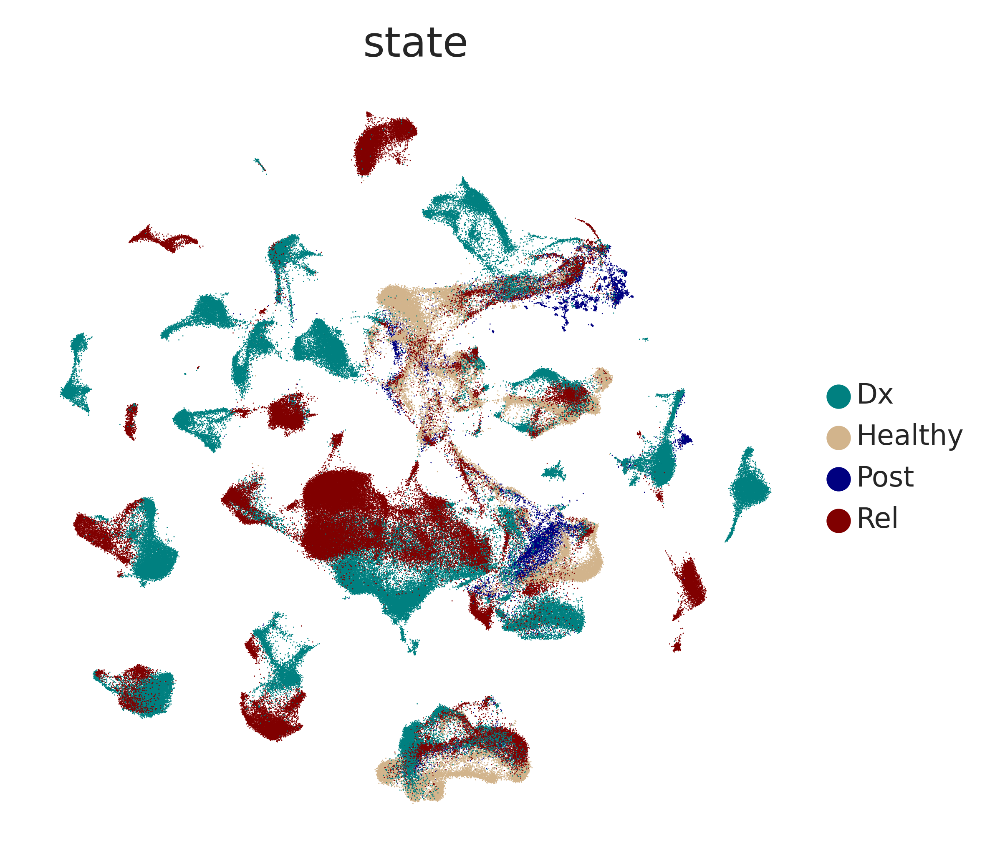

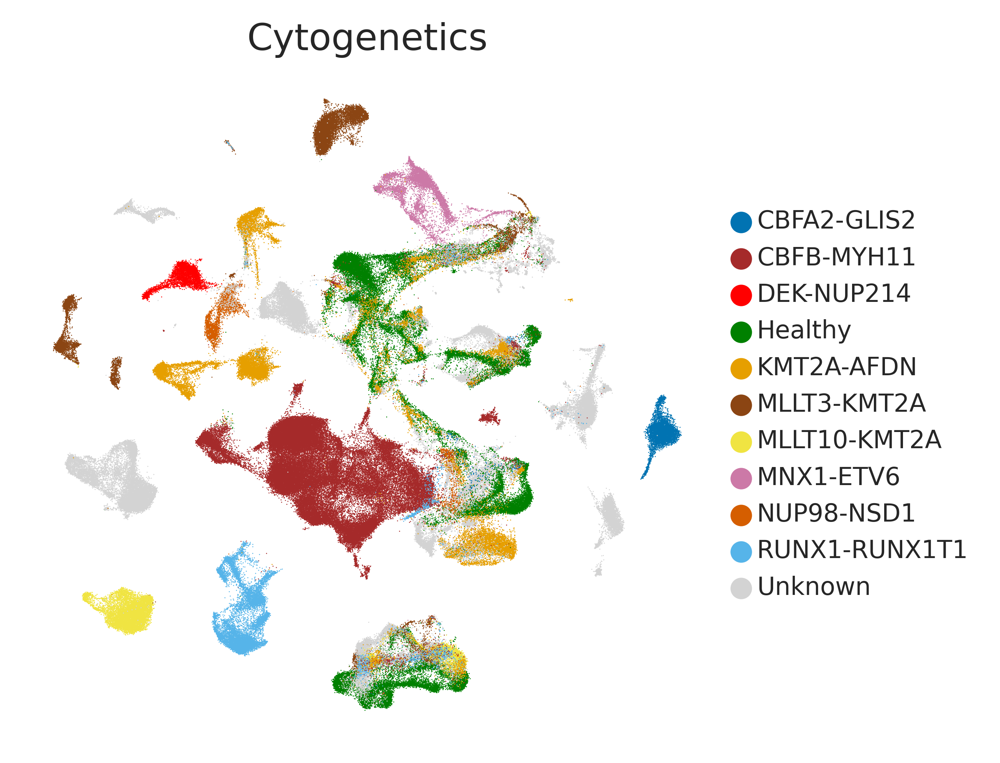

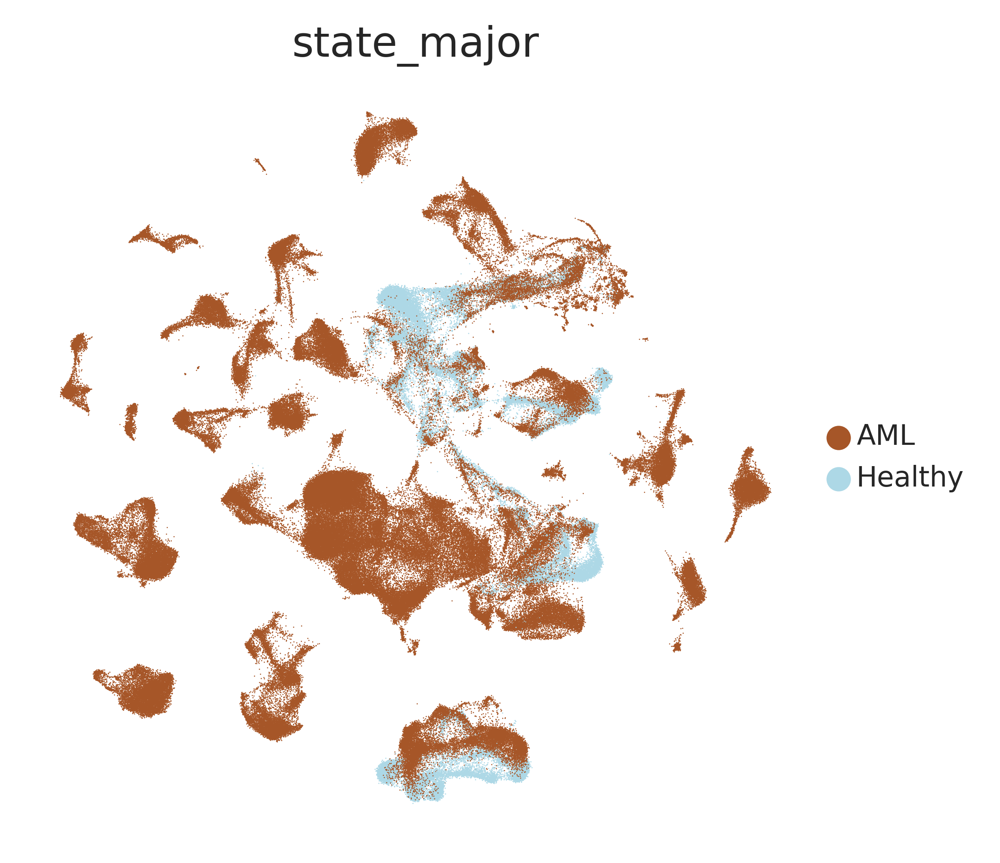

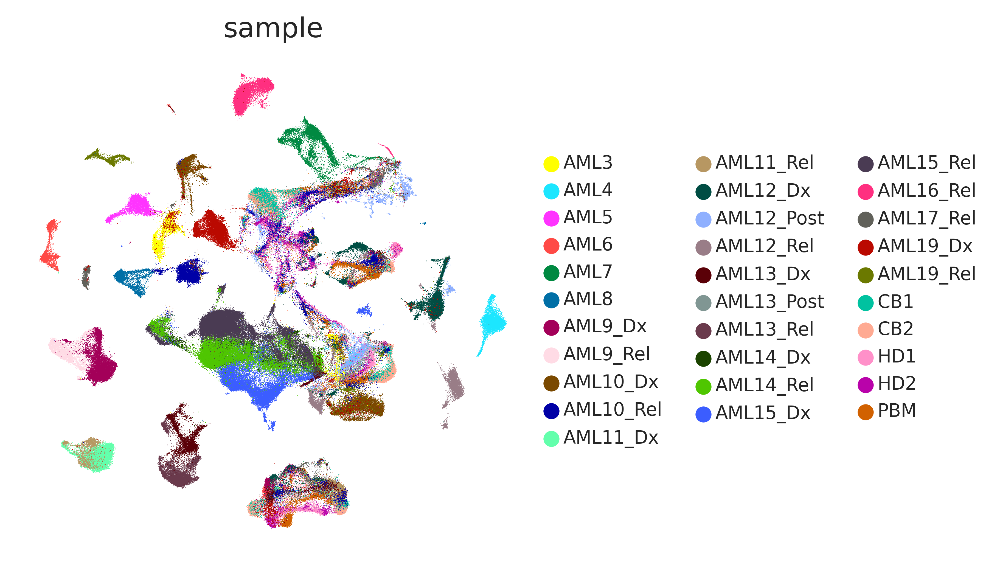

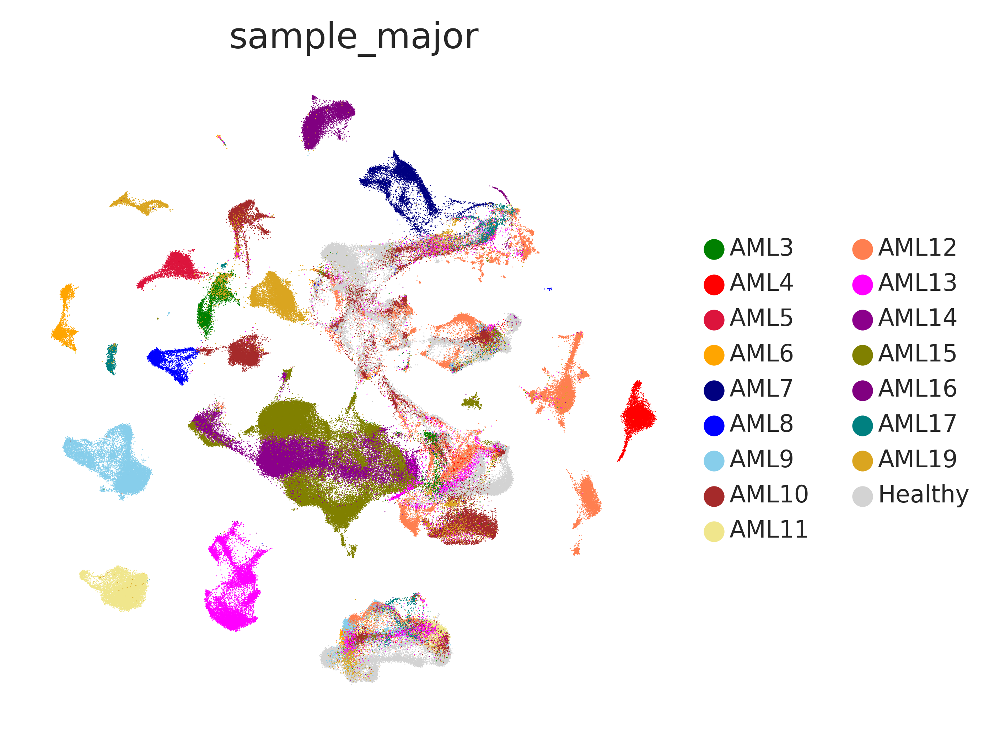

In [12]:
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.embedding(
    mdata["rna"],
    color=["state"],palette = color_dict_state,
    basis="uninteg_UMAP",
     legend_fontsize = 8,legend_fontweight = "medium", save = "time_point.pdf"
    )

with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.embedding(
    mdata["rna"],
    color=["Cytogenetics"],palette = custom_fusion_colors,
    basis="uninteg_UMAP",
     legend_fontsize = 8,legend_fontweight = "medium" ,save = "Cyto_genetics.pdf"
    )    

with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.embedding(
    mdata["rna"],
    color=["state_major"],palette = TYPE_COLORS,
    basis="uninteg_UMAP",
     legend_fontsize = 8,legend_fontweight = "medium", save = "State_major.pdf"
    )
    
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.embedding(
    mdata["rna"],
    color=["sample"],
    basis="uninteg_UMAP",
     legend_fontsize = 8,legend_fontweight = "medium", save = "sample.pdf"
    )

with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.embedding(
    mdata["rna"],
    color=["sample_major"],palette = color_dict_sample_broad,
    basis="uninteg_UMAP",
     legend_fontsize = 8,legend_fontweight = "medium", save = "sample_major.pdf"
    )
 